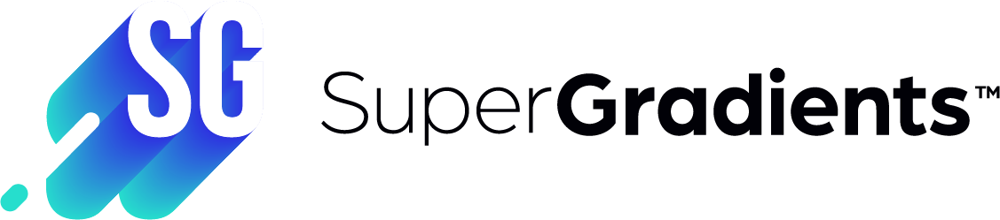

# SuperGradients Transfer Learning Semantic Segmentation

In the following tutorial, we will demonstrate how to use one of SuperGradients pre-trained models and a custom dataset to improve the model's accuracy using transfer learning for semantic segmentation.

Transfer Learning from a pre-trained checkpoint on your own dataset could prove to be very effective instead of deploying the pre-trained model directly on your data or training a model from scratch. For more information on Transfer Learning, please visit: https://cs231n.github.io/transfer-learning/

In the following example, transfer learning will be used from a Cityscapes PPLiteSeg model to a subset of the Supervisely person segmentation dataset .

For more details about the FILTERED dataset we wil use see: https://github.com/PaddlePaddle/PaddleSeg/tree/release/2.3/contrib/PP-HumanSeg

An example real-world use-case of the afformentioned scenario could be background removal in real time for video confrences.[link text](https://)

The notebook is divided into 7 sections: 
1. Experiment setup
2. Dataset definition
3. Architecture definition
4. Training setup
5. Training and Evaluation
6. Predict
7. Convert to ONNX\TensorRT

#Install SG

The cell below will install **super_gradients** which will automatically get all its dependencies.

In [1]:
! pip install https://deci-pretrained-models.s3.amazonaws.com/super_gradients-1.8.0rc4308l-py3-none-any.whl gwpy &> /dev/null
! pip install prettyformatter gwpy &> /dev/null
! pip install onnx-simplifier gwpy &> /dev/null
! pip install infery gwpy &> /dev/null

# 1. Experiment setup
We will initialize our **trainer** which will be in charge of everything, like training, evaluation, saving checkpoints, plotting etc.

The **experiment name** argument is important as every checkpoints, logs and tensorboards to be saved in a directory with the same name. This directory will be created as a sub-directory of **ckpt_root_dir** as follow:

```
ckpt_root_dir
|─── experiment_name_1
│       ckpt_best.pth                     # Model checkpoint on best epoch
│       ckpt_latest.pth                   # Model checkpoint on last epoch
│       average_model.pth                 # Model checkpoint averaged over epochs
│       events.out.tfevents.1659878383... # Tensorflow artifacts of a specific run
│       log_Aug07_11_52_48.txt            # Trainer logs of a specific run
└─── experiment_name_2
        ...
```
In this notebook multi-gpu training is set as `OFF`, for Distributed training multi_gpu can be set as
 `MultiGPUMode.DISTRIBUTED_DATA_PARALLEL` or `MultiGPUMode.DATA_PARALLEL`.

Let's define **ckpt_root_dir** inside the Colab, later we can use it to start TensorBoard and monitor the run.

In [2]:
from super_gradients.training import Trainer, MultiGPUMode

CHECKPOINT_DIR = '/home/notebook_ckpts/'
trainer = Trainer(experiment_name="segmentation_transfer_learning", ckpt_root_dir=CHECKPOINT_DIR, multi_gpu=MultiGPUMode.OFF)

You did not mention an AWS environment.You can set the environment variable ENVIRONMENT_NAME with one of the values: development,staging,production
quantization_utils -WARNING- Failed to import pytorch_quantization
env_sanity_check -INFO- ** A sanity check is done when importing super_gradients for the first time. **
-> You can see the details by setting the env variable DISPLAY_SANITY_CHECK=True prior to import.


# 2. Dataset definition



For the sake of this presentation, we'll use **Supervisely** semantic segmentation dataset. 

SG trainer is fully compatible with PyTorch data loaders, so you can definitely use your own data for the experiment below if you prefer.

## 2.A. Download data


Feel free to change the download path by editing SUPERVISELY_DATASET_DOWNLOAD_PATH

In [3]:
import os

SUPERVISELY_DATASET_DOWNLOAD_PATH="/home/data"

supervisely_dataset_dir_path = SUPERVISELY_DATASET_DOWNLOAD_PATH + os.path.sep + 'supervisely-persons'

if os.path.isdir(supervisely_dataset_dir_path):
    print('supervisely dataset already downloaded...')
else:
    print('Downloading and extracting supervisely dataset to: ' + SUPERVISELY_DATASET_DOWNLOAD_PATH)
    ! mkdir $SUPERVISELY_DATASET_DOWNLOAD_PATH
    %cd $SUPERVISELY_DATASET_DOWNLOAD_PATH
    ! wget https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
    ! unzip --qq supervisely-persons.zip

/home/data
--2022-09-13 18:26:29--  https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
Resolving deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)... 52.216.162.11
Connecting to deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)|52.216.162.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3564001012 (3.3G) [application/zip]
Saving to: ‘supervisely-persons.zip’

supervisely-persons 100%[===================>]   3.32G  6.39MB/s    in 3m 17s  

2022-09-13 18:29:47 (17.2 MB/s) - ‘supervisely-persons.zip’ saved [3564001012/3564001012]



## 2.B. Create data loaders


The dataloaders are initiated with the default parameters defined in the [yaml](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/dataset_params/supervisely_persons_dataset_params.yaml)
file. Parameters as batch_size, transforms, root_dir and others can be overridden by passing as `dataset_params` and
`dataloader_params`, as implemented bellow.

In [4]:
from super_gradients.training import dataloaders

root_dir = supervisely_dataset_dir_path
batch_size = 8

train_loader = dataloaders.supervisely_persons_train(
    dataset_params={"root_dir": root_dir},
    dataloader_params={"batch_size": batch_size, "num_workers": 2}
)
valid_loader = dataloaders.supervisely_persons_val(
    dataset_params={"root_dir": root_dir},
    dataloader_params={"batch_size": batch_size, "num_workers": 2}
)

/usr/local/lib/python3.7/dist-packages/super_gradients/training/dataloaders/dataloaders.py:53: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize_config_dir(config_dir=pkg_resources.resource_filename("super_gradients.recipes", "")):
/usr/local/lib/python3.7/dist-packages/super_gradients/training/dataloaders/dataloaders.py:53: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize_config_dir(config_dir=pkg_resources.resource_filename("super_gradients.recipes", "")):


As you can see, we didn't have to pass many parameters into the dataloaders construction. That's because defaults are pre-defined for your convenience, and you might be curious to know what they are. Let's print them and see which resolution and transformations are defined.

In [5]:
from prettyformatter import pprint

print('Dataloader parameters:')
pprint(train_loader.dataloader_params)
print('Dataset parameters')
pprint(train_loader.dataset.dataset_params)

Dataloader parameters:
{"batch_size": 8, "num_workers": 2, "drop_last": True}
Dataset parameters
{
    "root_dir"      : "/home/data/supervisely-persons",
    "list_file"     : "train.csv",
    "cache_labels"  : False,
    "cache_images"  : False,
    "transforms":
        [{'RandomRescaleSeg': {'scales': [0.25, 1.0]}}, {'ColorJitterSeg': {'brightness': 0.5, 'contrast': 0.5, 'saturation': 0.5}}, {'RandomFlipSeg': {'prob': 0.5}}, {'PadShortToCropSizeSeg': {'crop_size': [320, 480], 'fill_mask': 0}}, {'CropImageAndMaskSeg': {'crop_size': [320, 480], 'mode': 'random'}}],
}


We can take a look at some images from the dataset.

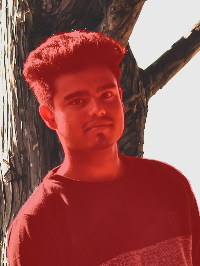

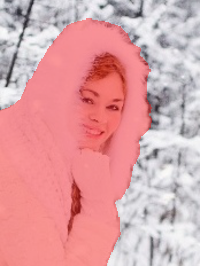

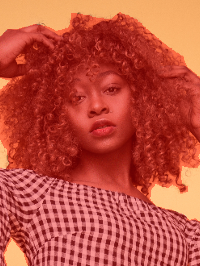

In [9]:
from PIL import Image
from torchvision.utils import draw_segmentation_masks
from torchvision.transforms import ToTensor, ToPILImage, Resize
import numpy as np
import torch

def plot_seg_data(img_path: str, target_path: str):
  image = (ToTensor()(Image.open(img_path).convert('RGB')) * 255).type(torch.uint8)
  target = torch.from_numpy(np.array(Image.open(target_path))).bool()
  image = draw_segmentation_masks(image, target, colors="red", alpha=0.4)
  image = Resize(size=200)(image)
  display(ToPILImage()(image))

for i in range(4, 7):
  img_path, target_path = train_loader.dataset.samples_targets_tuples_list[i]
  plot_seg_data(img_path, target_path)

# 3. Architecture definition



SG includes implementations of many different architectures for semantic segmentation tasks that can be found [here](https://github.com/Deci-AI/super-gradients#implemented-model-architectures).

Create a PPLiteSeg nn.Module, with 1 class segmentation head classifier. For simplicity `use_aux_head` is set as `False`
and extra Auxiliary heads aren't used for training.

Other segmentation modules can be used for this task such as, DDRNet, STDC and RegSeg.


In [12]:
from super_gradients.training import models

model = models.get(name="pp_lite_t_seg75",
                   arch_params={"use_aux_heads": False},
                   num_classes=1,
                   pretrained_weights="cityscapes")

Downloading: "https://deci-pretrained-models.s3.amazonaws.com/ppliteseg/cityscapes/pplite_t_seg75/average_model.pth" to /root/.cache/torch/hub/checkpoints/ppliteseg_cityscapes_pplite_t_seg75_average_model.pth


  0%|          | 0.00/31.4M [00:00<?, ?B/s]

# 4. Training setup





Here we define the training recipe. The full parameters can be found here  [training parameters supported](https://deci-ai.github.io/super-gradients/user_guide.html#training-parameters).

We will be using an average of BCE and Dice loss for segmentation, with different learning rates for the replaced segmentation head layer, and the rest of the network- this is controlled by the `multiply_head_lr` parameter which is the multiplication factor of the learning rate for the newly replaced layer.

As our `metric_to_watch`, we will be monitoring the `target_IOU` which is one of the components of `BinaryIOU` torchmetrics object (the other components are `mean_IOU` which is the mean of the background and target IOUs, and `background_IOU`).

In [13]:
from super_gradients.training.metrics.segmentation_metrics import BinaryIOU
from super_gradients.training.utils.callbacks import BinarySegmentationVisualizationCallback, Phase

train_params = {"max_epochs": 25,
                "lr_mode": "cosine",
                "initial_lr": 0.005,
                "lr_warmup_epochs": 5,
                "multiply_head_lr": 10,
                "optimizer": "SGD",
                "loss": "bce_dice_loss",
                "ema": True,
                "zero_weight_decay_on_bias_and_bn": True,
                "average_best_models": True,
                "metric_to_watch": "target_IOU",
                "greater_metric_to_watch_is_better": True,
                "train_metrics_list": [BinaryIOU()],
                "valid_metrics_list": [BinaryIOU()],
                "loss_logging_items_names": ["loss"],
                "phase_callbacks": [BinarySegmentationVisualizationCallback(phase=Phase.VALIDATION_BATCH_END,
                                                                            freq=1,
                                                                            last_img_idx_in_batch=4)],
                }

# 5. Training and evaluation


## 5.A. Connect tensor board

Make sure to visit the IMAGES tab inside tensorboard once every few epochs to see the predictions improvement on some sample images-
- True positive pixels - $\color {green}{\text{segmented in Green}}$
- False positive pixels - $\color {blue}{\text{segmented in Blue}}$ 
- False negative pixels - $\color {red}{\text{segmented in Red}}$

In [14]:
%load_ext tensorboard
%tensorboard --logdir /home/notebook_ckpts/ --bind_all

<IPython.core.display.Javascript object>

## 5.B. Start Training

The logs and the checkpoint for the latest epoch will be kept in your experiment folder.

To start training we'll call train(...) and provide it with the objects we construted above: the model, the training parameters and the data loaders.

**Note:** While training, don't forget to refresh the tensorboard with the arrow on the top right.

In [15]:
trainer.train(model=model, training_params=train_params, train_loader=train_loader, valid_loader=valid_loader)

sg_trainer -INFO- Using EMA with params {}
sg_trainer -INFO- Started training for 25 epochs (0/24)



Train epoch 0:   0%|          | 0/309 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:393: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  FutureWarning)
Validation epoch 0: 100%|██████████| 65/65 [00:12<00:00,  5.16it/s]


SUMMARY OF EPOCH 0
├── Training
│   └── Loss = 0.2205
└── Validation
    ├── Loss = 0.1821
    └── Target_iou = 0.8547

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.8547177910804749


Validation epoch 1: 100%|██████████| 65/65 [00:16<00:00,  4.02it/s]


SUMMARY OF EPOCH 1
├── Training
│   └── Loss = 0.1617
│       ├── Best until now = 0.2205 (↘ -0.0589)
│       └── Epoch N-1      = 0.2205 (↘ -0.0589)
└── Validation
    ├── Loss = 0.1659
    │   ├── Best until now = 0.1821 (↘ -0.0162)
    │   └── Epoch N-1      = 0.1821 (↘ -0.0162)
    └── Target_iou = 0.8781
        ├── Best until now = 0.8547 (↗ 0.0234)
        └── Epoch N-1      = 0.8547 (↗ 0.0234)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.8780770897865295


Validation epoch 2: 100%|██████████| 65/65 [00:12<00:00,  5.22it/s]


SUMMARY OF EPOCH 2
├── Training
│   └── Loss = 0.1409
│       ├── Best until now = 0.1617 (↘ -0.0207)
│       └── Epoch N-1      = 0.1617 (↘ -0.0207)
└── Validation
    ├── Loss = 0.1498
    │   ├── Best until now = 0.1659 (↘ -0.0161)
    │   └── Epoch N-1      = 0.1659 (↘ -0.0161)
    └── Target_iou = 0.8781
        ├── Best until now = 0.8781 (↘ -0.0)
        └── Epoch N-1      = 0.8781 (↘ -0.0)



Validation epoch 3: 100%|██████████| 65/65 [00:13<00:00,  4.81it/s]


SUMMARY OF EPOCH 3
├── Training
│   └── Loss = 0.1339
│       ├── Best until now = 0.1409 (↘ -0.007)
│       └── Epoch N-1      = 0.1409 (↘ -0.007)
└── Validation
    ├── Loss = 0.1483
    │   ├── Best until now = 0.1498 (↘ -0.0015)
    │   └── Epoch N-1      = 0.1498 (↘ -0.0015)
    └── Target_iou = 0.8814
        ├── Best until now = 0.8781 (↗ 0.0033)
        └── Epoch N-1      = 0.8781 (↗ 0.0033)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.8813930153846741


Validation epoch 4: 100%|██████████| 65/65 [00:12<00:00,  5.23it/s]


SUMMARY OF EPOCH 4
├── Training
│   └── Loss = 0.1198
│       ├── Best until now = 0.1339 (↘ -0.0141)
│       └── Epoch N-1      = 0.1339 (↘ -0.0141)
└── Validation
    ├── Loss = 0.1394
    │   ├── Best until now = 0.1483 (↘ -0.0089)
    │   └── Epoch N-1      = 0.1483 (↘ -0.0089)
    └── Target_iou = 0.8892
        ├── Best until now = 0.8814 (↗ 0.0078)
        └── Epoch N-1      = 0.8814 (↗ 0.0078)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.8892211318016052


Validation epoch 5: 100%|██████████| 65/65 [00:12<00:00,  5.20it/s]


SUMMARY OF EPOCH 5
├── Training
│   └── Loss = 0.1148
│       ├── Best until now = 0.1198 (↘ -0.005)
│       └── Epoch N-1      = 0.1198 (↘ -0.005)
└── Validation
    ├── Loss = 0.123
    │   ├── Best until now = 0.1394 (↘ -0.0165)
    │   └── Epoch N-1      = 0.1394 (↘ -0.0165)
    └── Target_iou = 0.9013
        ├── Best until now = 0.8892 (↗ 0.0121)
        └── Epoch N-1      = 0.8892 (↗ 0.0121)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9013192057609558


Validation epoch 6: 100%|██████████| 65/65 [00:12<00:00,  5.17it/s]


SUMMARY OF EPOCH 6
├── Training
│   └── Loss = 0.1084
│       ├── Best until now = 0.1148 (↘ -0.0064)
│       └── Epoch N-1      = 0.1148 (↘ -0.0064)
└── Validation
    ├── Loss = 0.1154
    │   ├── Best until now = 0.123  (↘ -0.0076)
    │   └── Epoch N-1      = 0.123  (↘ -0.0076)
    └── Target_iou = 0.9085
        ├── Best until now = 0.9013 (↗ 0.0072)
        └── Epoch N-1      = 0.9013 (↗ 0.0072)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9085091948509216


Validation epoch 7: 100%|██████████| 65/65 [00:12<00:00,  5.23it/s]


SUMMARY OF EPOCH 7
├── Training
│   └── Loss = 0.1087
│       ├── Best until now = 0.1084 (↗ 0.0003)
│       └── Epoch N-1      = 0.1084 (↗ 0.0003)
└── Validation
    ├── Loss = 0.1147
    │   ├── Best until now = 0.1154 (↘ -0.0007)
    │   └── Epoch N-1      = 0.1154 (↘ -0.0007)
    └── Target_iou = 0.9082
        ├── Best until now = 0.9085 (↘ -0.0003)
        └── Epoch N-1      = 0.9085 (↘ -0.0003)



Validation epoch 8: 100%|██████████| 65/65 [00:12<00:00,  5.21it/s]


SUMMARY OF EPOCH 8
├── Training
│   └── Loss = 0.0989
│       ├── Best until now = 0.1084 (↘ -0.0095)
│       └── Epoch N-1      = 0.1087 (↘ -0.0098)
└── Validation
    ├── Loss = 0.1078
    │   ├── Best until now = 0.1147 (↘ -0.0069)
    │   └── Epoch N-1      = 0.1147 (↘ -0.0069)
    └── Target_iou = 0.9145
        ├── Best until now = 0.9085 (↗ 0.006)
        └── Epoch N-1      = 0.9082 (↗ 0.0063)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9145185947418213


Validation epoch 9: 100%|██████████| 65/65 [00:12<00:00,  5.21it/s]


SUMMARY OF EPOCH 9
├── Training
│   └── Loss = 0.0956
│       ├── Best until now = 0.0989 (↘ -0.0033)
│       └── Epoch N-1      = 0.0989 (↘ -0.0033)
└── Validation
    ├── Loss = 0.1084
    │   ├── Best until now = 0.1078 (↗ 0.0007)
    │   └── Epoch N-1      = 0.1078 (↗ 0.0007)
    └── Target_iou = 0.9147
        ├── Best until now = 0.9145 (↗ 0.0002)
        └── Epoch N-1      = 0.9145 (↗ 0.0002)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9147140383720398


Validation epoch 10: 100%|██████████| 65/65 [00:12<00:00,  5.20it/s]


SUMMARY OF EPOCH 10
├── Training
│   └── Loss = 0.0947
│       ├── Best until now = 0.0956 (↘ -0.0009)
│       └── Epoch N-1      = 0.0956 (↘ -0.0009)
└── Validation
    ├── Loss = 0.1065
    │   ├── Best until now = 0.1078 (↘ -0.0013)
    │   └── Epoch N-1      = 0.1084 (↘ -0.002)
    └── Target_iou = 0.9154
        ├── Best until now = 0.9147 (↗ 0.0007)
        └── Epoch N-1      = 0.9147 (↗ 0.0007)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9153705835342407


Validation epoch 11: 100%|██████████| 65/65 [00:12<00:00,  5.19it/s]


SUMMARY OF EPOCH 11
├── Training
│   └── Loss = 0.0888
│       ├── Best until now = 0.0947 (↘ -0.0058)
│       └── Epoch N-1      = 0.0947 (↘ -0.0058)
└── Validation
    ├── Loss = 0.1056
    │   ├── Best until now = 0.1065 (↘ -0.0008)
    │   └── Epoch N-1      = 0.1065 (↘ -0.0008)
    └── Target_iou = 0.9161
        ├── Best until now = 0.9154 (↗ 0.0007)
        └── Epoch N-1      = 0.9154 (↗ 0.0007)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9160913228988647


Validation epoch 12: 100%|██████████| 65/65 [00:12<00:00,  5.18it/s]


SUMMARY OF EPOCH 12
├── Training
│   └── Loss = 0.0832
│       ├── Best until now = 0.0888 (↘ -0.0057)
│       └── Epoch N-1      = 0.0888 (↘ -0.0057)
└── Validation
    ├── Loss = 0.1048
    │   ├── Best until now = 0.1056 (↘ -0.0008)
    │   └── Epoch N-1      = 0.1056 (↘ -0.0008)
    └── Target_iou = 0.9174
        ├── Best until now = 0.9161 (↗ 0.0013)
        └── Epoch N-1      = 0.9161 (↗ 0.0013)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9173685908317566


Validation epoch 13: 100%|██████████| 65/65 [00:12<00:00,  5.17it/s]


SUMMARY OF EPOCH 13
├── Training
│   └── Loss = 0.0779
│       ├── Best until now = 0.0832 (↘ -0.0053)
│       └── Epoch N-1      = 0.0832 (↘ -0.0053)
└── Validation
    ├── Loss = 0.104
    │   ├── Best until now = 0.1048 (↘ -0.0008)
    │   └── Epoch N-1      = 0.1048 (↘ -0.0008)
    └── Target_iou = 0.9182
        ├── Best until now = 0.9174 (↗ 0.0009)
        └── Epoch N-1      = 0.9174 (↗ 0.0009)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9182296991348267


Validation epoch 14: 100%|██████████| 65/65 [00:12<00:00,  5.25it/s]


SUMMARY OF EPOCH 14
├── Training
│   └── Loss = 0.0744
│       ├── Best until now = 0.0779 (↘ -0.0035)
│       └── Epoch N-1      = 0.0779 (↘ -0.0035)
└── Validation
    ├── Loss = 0.1035
    │   ├── Best until now = 0.104  (↘ -0.0005)
    │   └── Epoch N-1      = 0.104  (↘ -0.0005)
    └── Target_iou = 0.9187
        ├── Best until now = 0.9182 (↗ 0.0005)
        └── Epoch N-1      = 0.9182 (↗ 0.0005)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9187425971031189


Validation epoch 15: 100%|██████████| 65/65 [00:12<00:00,  5.24it/s]


SUMMARY OF EPOCH 15
├── Training
│   └── Loss = 0.0699
│       ├── Best until now = 0.0744 (↘ -0.0045)
│       └── Epoch N-1      = 0.0744 (↘ -0.0045)
└── Validation
    ├── Loss = 0.1032
    │   ├── Best until now = 0.1035 (↘ -0.0003)
    │   └── Epoch N-1      = 0.1035 (↘ -0.0003)
    └── Target_iou = 0.919
        ├── Best until now = 0.9187 (↗ 0.0002)
        └── Epoch N-1      = 0.9187 (↗ 0.0002)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9189873933792114


Validation epoch 16: 100%|██████████| 65/65 [00:12<00:00,  5.21it/s]


SUMMARY OF EPOCH 16
├── Training
│   └── Loss = 0.0694
│       ├── Best until now = 0.0699 (↘ -0.0006)
│       └── Epoch N-1      = 0.0699 (↘ -0.0006)
└── Validation
    ├── Loss = 0.103
    │   ├── Best until now = 0.1032 (↘ -0.0002)
    │   └── Epoch N-1      = 0.1032 (↘ -0.0002)
    └── Target_iou = 0.9191
        ├── Best until now = 0.919  (↗ 0.0002)
        └── Epoch N-1      = 0.919  (↗ 0.0002)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9191451072692871


Validation epoch 17: 100%|██████████| 65/65 [00:12<00:00,  5.23it/s]


SUMMARY OF EPOCH 17
├── Training
│   └── Loss = 0.0633
│       ├── Best until now = 0.0694 (↘ -0.0061)
│       └── Epoch N-1      = 0.0694 (↘ -0.0061)
└── Validation
    ├── Loss = 0.1028
    │   ├── Best until now = 0.103  (↘ -0.0002)
    │   └── Epoch N-1      = 0.103  (↘ -0.0002)
    └── Target_iou = 0.9193
        ├── Best until now = 0.9191 (↗ 0.0001)
        └── Epoch N-1      = 0.9191 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9192915558815002


Validation epoch 18: 100%|██████████| 65/65 [00:12<00:00,  5.25it/s]


SUMMARY OF EPOCH 18
├── Training
│   └── Loss = 0.0628
│       ├── Best until now = 0.0633 (↘ -0.0005)
│       └── Epoch N-1      = 0.0633 (↘ -0.0005)
└── Validation
    ├── Loss = 0.1027
    │   ├── Best until now = 0.1028 (↘ -1e-04)
    │   └── Epoch N-1      = 0.1028 (↘ -1e-04)
    └── Target_iou = 0.9194
        ├── Best until now = 0.9193 (↗ 0.0001)
        └── Epoch N-1      = 0.9193 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9194266200065613


Validation epoch 19: 100%|██████████| 65/65 [00:12<00:00,  5.25it/s]


SUMMARY OF EPOCH 19
├── Training
│   └── Loss = 0.0603
│       ├── Best until now = 0.0628 (↘ -0.0024)
│       └── Epoch N-1      = 0.0628 (↘ -0.0024)
└── Validation
    ├── Loss = 0.1025
    │   ├── Best until now = 0.1027 (↘ -1e-04)
    │   └── Epoch N-1      = 0.1027 (↘ -1e-04)
    └── Target_iou = 0.9196
        ├── Best until now = 0.9194 (↗ 0.0001)
        └── Epoch N-1      = 0.9194 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.919569194316864


Validation epoch 20: 100%|██████████| 65/65 [00:12<00:00,  5.22it/s]


SUMMARY OF EPOCH 20
├── Training
│   └── Loss = 0.0592
│       ├── Best until now = 0.0603 (↘ -0.0011)
│       └── Epoch N-1      = 0.0603 (↘ -0.0011)
└── Validation
    ├── Loss = 0.1024
    │   ├── Best until now = 0.1025 (↘ -1e-04)
    │   └── Epoch N-1      = 0.1025 (↘ -1e-04)
    └── Target_iou = 0.9197
        ├── Best until now = 0.9196 (↗ 0.0001)
        └── Epoch N-1      = 0.9196 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.919718861579895


Validation epoch 21: 100%|██████████| 65/65 [00:12<00:00,  5.26it/s]


SUMMARY OF EPOCH 21
├── Training
│   └── Loss = 0.0575
│       ├── Best until now = 0.0592 (↘ -0.0017)
│       └── Epoch N-1      = 0.0592 (↘ -0.0017)
└── Validation
    ├── Loss = 0.1024
    │   ├── Best until now = 0.1024 (↘ -1e-04)
    │   └── Epoch N-1      = 0.1024 (↘ -1e-04)
    └── Target_iou = 0.9198
        ├── Best until now = 0.9197 (↗ 0.0001)
        └── Epoch N-1      = 0.9197 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9198471307754517


Validation epoch 22: 100%|██████████| 65/65 [00:12<00:00,  5.23it/s]


SUMMARY OF EPOCH 22
├── Training
│   └── Loss = 0.0579
│       ├── Best until now = 0.0575 (↗ 0.0005)
│       └── Epoch N-1      = 0.0575 (↗ 0.0005)
└── Validation
    ├── Loss = 0.1023
    │   ├── Best until now = 0.1024 (↘ -1e-04)
    │   └── Epoch N-1      = 0.1024 (↘ -1e-04)
    └── Target_iou = 0.92
        ├── Best until now = 0.9198 (↗ 0.0001)
        └── Epoch N-1      = 0.9198 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9199803471565247


Validation epoch 23: 100%|██████████| 65/65 [00:12<00:00,  5.27it/s]


SUMMARY OF EPOCH 23
├── Training
│   └── Loss = 0.0572
│       ├── Best until now = 0.0575 (↘ -0.0003)
│       └── Epoch N-1      = 0.0579 (↘ -0.0008)
└── Validation
    ├── Loss = 0.1022
    │   ├── Best until now = 0.1023 (↘ -1e-04)
    │   └── Epoch N-1      = 0.1023 (↘ -1e-04)
    └── Target_iou = 0.9201
        ├── Best until now = 0.92   (↗ 0.0001)
        └── Epoch N-1      = 0.92   (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9200901389122009


Validation epoch 24: 100%|██████████| 65/65 [00:12<00:00,  5.22it/s]


SUMMARY OF EPOCH 24
├── Training
│   └── Loss = 0.0556
│       ├── Best until now = 0.0572 (↘ -0.0016)
│       └── Epoch N-1      = 0.0572 (↘ -0.0016)
└── Validation
    ├── Loss = 0.1021
    │   ├── Best until now = 0.1022 (↘ -1e-04)
    │   └── Epoch N-1      = 0.1022 (↘ -1e-04)
    └── Target_iou = 0.9202
        ├── Best until now = 0.9201 (↗ 0.0001)
        └── Epoch N-1      = 0.9201 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/segmentation_transfer_learning/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.9202083945274353
sg_trainer -INFO- RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...


Validation epoch 25: 100%|██████████| 65/65 [00:12<00:00,  5.23it/s]


SUMMARY OF EPOCH 25
├── Training
│   └── Loss = 0.0556
│       ├── Best until now = 0.0572 (↘ -0.0016)
│       └── Epoch N-1      = 0.0572 (↘ -0.0016)
└── Validation
    ├── Loss = 0.1025
    │   ├── Best until now = 0.1021 (↗ 0.0004)
    │   └── Epoch N-1      = 0.1021 (↗ 0.0004)
    └── Target_iou = 0.9196
        ├── Best until now = 0.9202 (↘ -0.0006)
        └── Epoch N-1      = 0.9202 (↘ -0.0006)



In [16]:
print("Best Checkpoint mIoU is: "+ str(trainer.best_metric.item()))

Best Checkpoint mIoU is: 0.9202083945274353


Now you can download your trained weights from this directory

In [17]:
print(trainer.checkpoints_dir_path)

/home/notebook_ckpts/segmentation_transfer_learning


# 6. Predict


When the training is complete you can use the trained model to get predictions on the validation set, your data or some other image. Let's load some image and 
run a model inference to create a binary segmentation mask.

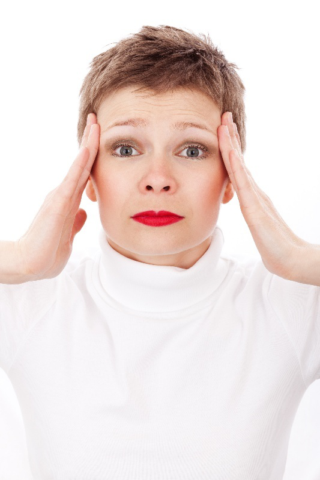

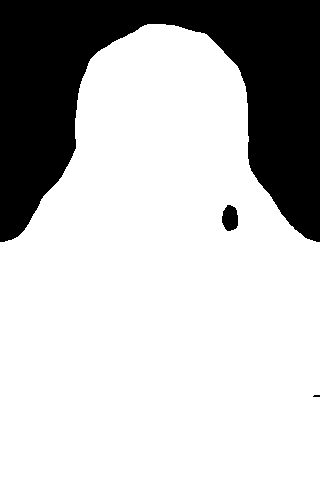

In [18]:
from torchvision.transforms import Compose, ToTensor, Resize, Normalize, ToPILImage

# Initiate a model with best checkpoint.
model = models.get(name="pp_lite_t_seg75",
                   arch_params={"use_aux_heads": False},
                   num_classes=1,
                   checkpoint_path=os.path.join(trainer.checkpoints_dir_path, "ckpt_best.pth")).cuda().eval()

pre_proccess = Compose([
    ToTensor(),
    Normalize([.485, .456, .406], [.229, .224, .225])
])

demo_img_path = "/home/data/supervisely-persons/images/ache-adult-depression-expression-41253.png"
img = Image.open(demo_img_path)
# Resize the image and display
img = Resize(size=(480, 320))(img)
display(img)

# Run pre-proccess - transforms to tensor and apply normalizations.
img_inp = pre_proccess(img).unsqueeze(0).cuda()

# Run inference
mask = model(img_inp)

# Run post-proccess - apply sigmoid to output probabilities, then apply hard
# threshold of 0.5 for binary mask prediction. 
mask = torch.sigmoid(mask).gt(0.5).squeeze()
mask = ToPILImage()(mask.float())
display(mask)


# 7. Convert to ONNX/TensorRT

SG is a production ready library. All the models implemented in SG can be compiled to ONNX and TensorRT. Deci also offers the [Infery](https://docs.deci.ai/docs/installing-infery) library that allows to do inference on models saved in various frameworks with the same API regardless of a framework.

Let's compile our model to ONNX. 

In [19]:
from onnxsim import simplify
import onnx

input_size = [1, 3, 480, 320]
onnx_path = "/home/data/model.onnx"

model.prep_model_for_conversion(input_size=input_size)

torch.onnx.export(model,
                  torch.randn(*input_size).cuda(),
                  onnx_path,
                  opset_version=11)

# onnx simplifier
model_sim, check = simplify(onnx_path)
assert check, "Simplified ONNX model could not be validated"
onnx.save_model(model_sim, onnx_path)

print("ONNX successfully created at: ", onnx_path)


ONNX successfully created at:  /home/data/model.onnx


Run inference with `infery` library.

__init__ -INFO- Infery was successfully imported with 1 CPUS and 0 GPUS.
infery_manager -INFO- Loading model /home/data/model.onnx to the CPU
infery_manager -INFO- Successfully loaded /home/data/model.onnx to the CPU.


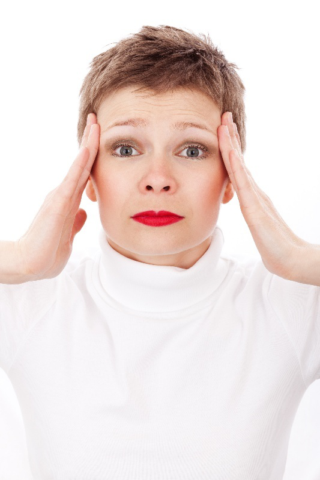

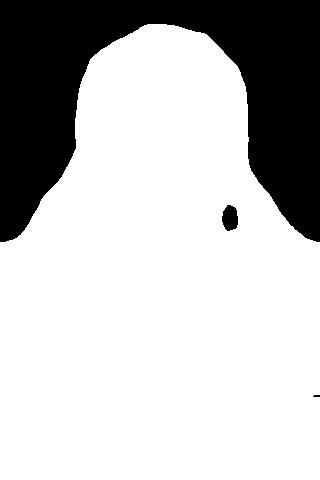

In [20]:
import infery

# Load model with infery
onnx_model = infery.load(model_path=onnx_path, framework_type='onnx', inference_hardware='cpu')

# Predict
display(img)
mask = torch.tensor(onnx_model.predict(img_inp.cpu().numpy())[0])

# Run post-proccess - apply sigmoid to output probabilities, then apply hard
# threshold of 0.5 for binary mask prediction. 
mask = torch.sigmoid(mask).gt(0.5).squeeze()
mask = ToPILImage()(mask.float())
display(mask)